In [1]:
%matplotlib inline
import random
import numpy as np
import matplotlib.pylab as plt
import os
os.environ["DJANGO_SETTINGS_MODULE"] = "analyzer.settings"
import sys
import django
django.setup()

In [2]:
import datetime
from datetime import timedelta

In [3]:
import pickle

In [4]:
# pickleからデータを開く
with open('kampo_list.pickle', mode='rb') as f:
    keme = pickle.load(f)
# group.name, user_count, start_day, user.username, steps, distance, kampo, step1, step2, ... , step10

In [5]:
mikan_data = keme[np.where( keme[:, 6] == False ), 7:17].copy()
kampo_data = keme[np.where( keme[:, 6] == True ), 7:17].copy()
mikan_data = mikan_data[0, ]
kampo_data = kampo_data[0, ]

In [6]:
import scipy
from scipy import cluster

In [7]:
sep_data = keme[np.where( keme[:, 2] == datetime.date(2015, 9, 11) ), 7:17].copy()
sep_data = sep_data[0, ]

oct_data = keme[np.where( keme[:, 2] == datetime.date(2015, 10, 6) ), 7:17].copy()
oct_data = oct_data[0, ]

nov_data = keme[np.where( keme[:, 2] == datetime.date(2015, 11, 1) ), 7:17].copy()
nov_data = nov_data[0, ]

In [8]:
# それぞれ ゼロばっかりの記録の人を除く
print sep_data.shape, oct_data.shape, nov_data.shape

rows = np.array([])
for i in range(len(sep_data)):
    if sum(sep_data[i]) == 0.0:
        rows = np.append( rows, i )
sep_data = np.delete( sep_data, rows, 0 )

rows = np.array([])
for i in range(len(oct_data)):
    if sum(oct_data[i]) == 0.0:
        rows = np.append( rows, i )
oct_data = np.delete( oct_data, rows, 0 )

rows = np.array([])
for i in range(len(nov_data)):
    if sum(nov_data[i]) == 0.0:
        rows = np.append( rows, i )
nov_data = np.delete( nov_data, rows, 0 )

print sep_data.shape, oct_data.shape, nov_data.shape

(189, 10) (388, 10) (460, 10)
(127, 10) (259, 10) (318, 10)


In [48]:
X = np.vstack([ sep_data, oct_data, nov_data ])

# ベクトル量子化してみよう！

# あきらめて杉山先生の量子化結果をもらう

In [9]:
codebook = np.array([ 18064.2734375, 6483.97900391, 8558.92480469, 2849.14038086, 
                     11663.4296875, 832.01855469, 33613.1328125, 4715.02880859])
codebook = np.sort(codebook)
print codebook

[   832.01855469   2849.14038086   4715.02880859   6483.97900391
   8558.92480469  11663.4296875   18064.2734375   33613.1328125 ]


In [10]:
# codebookを参照して月ごとのデータを離散化
# 各データをセントロイドに分類する
# ----------9月のデータ-------------#
data = sep_data.copy()
data = data.astype(np.float32)
data.shape = 1270,

sep_code, dist = scipy.cluster.vq.vq(data, codebook)

# print "portion of each code: "
# for i in xrange(8):
#     print "num of [%d]: " % i, np.count_nonzero((sep_code == i))
sep_code.shape = (127, 10)


# ----------10月のデータ-------------#
data = oct_data.copy()
data = data.astype(np.float32)
data.shape = 2590,

oct_code, dist = scipy.cluster.vq.vq(data, codebook)

# print "portion of each code: "
# for i in xrange(8):
#     print "num of [%d]: " % i, np.count_nonzero((oct_code == i))
oct_code.shape = (259, 10)


# ----------11月のデータ-------------#
data = nov_data.copy()
data = data.astype(np.float32)
data.shape = 3180,

nov_code, dist = scipy.cluster.vq.vq(data, codebook)

# print "portion of each code: "
# for i in xrange(8):
#     print "num of [%d]: " % i, np.count_nonzero((nov_code == i))
nov_code.shape = (318, 10)

In [11]:
sep_data = sep_code.copy()
oct_data = oct_code.copy()
nov_data = nov_code.copy()

In [12]:
import pandas
import seaborn

## 状態遷移図を描く関数

In [170]:
import networkx as nx
import numpy
import scipy.cluster
from sklearn.preprocessing import normalize

def combochart_p(cprobs, data, step_codebook, pthresh=.8, max_width=4., direction='LR'):
    _G = nx.DiGraph()
    _G.graph['rankdir'] = direction
    _G.graph['dpi'] = 600
    _quantities = normalize(
            [numpy.count_nonzero((data == i)) for i in range(len(step_codebook))]
    )[0] * max_width
    for i in numpy.arange(cprobs.shape[0]):
        _node_label = '%d: %d' % (i, step_codebook[i])
        print 'quantity:', _quantities[i]
        _G.add_node(i, label=_node_label, shape='circle', width=_quantities[i])
        for i in xrange(cprobs.shape[0]):
            _sxprobs = cprobs[i] ## probabilities of s_x, s in S(step class)
            _sorted_sxprobs = sorted(_sxprobs, reverse=True)
            _sum_p = 0
            _applied_sxprobs_idxs = []
            for p in _sorted_sxprobs:
                _sum_p += p
                if _sum_p > pthresh: break
                _idx, = numpy.where(_sxprobs == p)
                _applied_sxprobs_idxs.append(_idx[0])
            for j, idx in enumerate(_applied_sxprobs_idxs):
                _label = ' %.2f' % cprobs[i][idx] if cprobs[i][idx] > .01 else ' %.2e' % cprobs[i][j]
                _G.add_edge(
                    i, idx,
                    penwidth=max_width - i if max_width - i > 0 else 1,
                    label=_label,
                    color='black' if i == idx else 'blue' if i < idx else 'red',
                    weight=i,
                    fontsize=18
                )
    return _G

# 天候について解析

In [103]:
# 10日間の天候リスト 降雨ありが1、なしが0
# WEATHER = np.array([[0, 0, 0, 0, 0, 1, 1, 0, 0, 0], 
#                     [0, 0, 0, 1, 0, 1, 0, 0, 0, 0], 
#                     [0, 1, 1, 0, 0, 0, 0, 1, 1, 1]])

# codebook:  [  0.42307692  13.83333333  42.        ]で順序尺度化した天候
WEATHER = np.array([[0 0 0 0 0 0 2 0 0 0],
                    [0 0 0 0 0 0 0 0 0 0],
                    [0 1 0 0 0 0 0 1 1 0]])

SyntaxError: invalid syntax (<ipython-input-103-f1833a4d3975>, line 7)

### 雨→晴

In [168]:
N = 8
# 雨->晴の場合に切り出し
hoge = np.vstack( [sep_data[:, 6:8],
                  nov_data[:, 1:3],
                  nov_data[:, 8:10]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.3231  0.1615  0.1308  0.1308  0.1154  0.0846  0.0385  0.0154]
 [ 0.0845  0.2042  0.162   0.1972  0.1479  0.1479  0.0282  0.0282]
 [ 0.0576  0.1655  0.1655  0.1942  0.1511  0.1871  0.0647  0.0144]
 [ 0.0496  0.1405  0.1405  0.2231  0.2066  0.157   0.0661  0.0165]
 [ 0.0215  0.0968  0.1398  0.172   0.2688  0.172   0.1183  0.0108]
 [ 0.0526  0.0211  0.0947  0.1263  0.1368  0.3053  0.2211  0.0421]
 [ 0.      0.0556  0.0278  0.0278  0.1389  0.2222  0.4444  0.0833]
 [ 0.      0.      0.      0.      0.      0.1429  0.4286  0.4286]]


In [128]:
from nxpd import draw, nxpdParams

/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


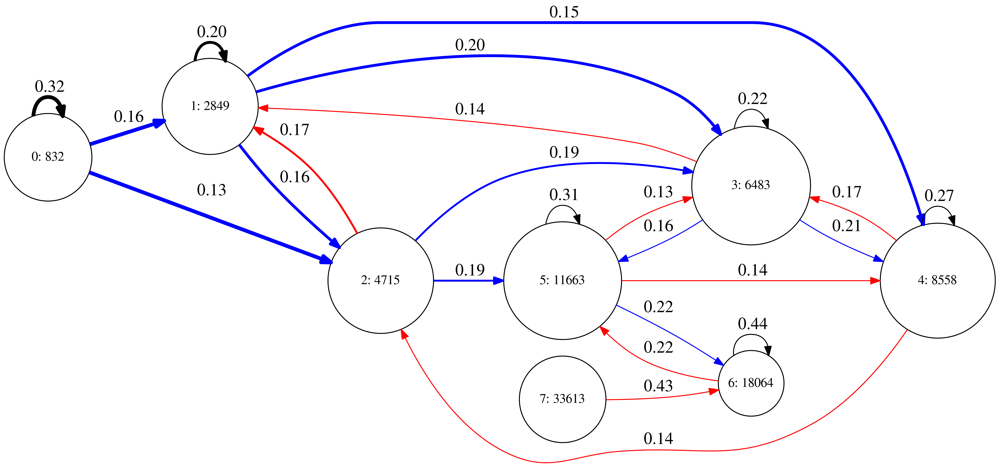

In [171]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Greens')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

### 晴→晴

In [172]:
# 晴->晴の場合に切り出し
hoge = np.vstack( [sep_data[:, 0:2],
                  sep_data[:, 1:3],
                  sep_data[:, 2:4],
                  sep_data[:, 3:5],
                  sep_data[:, 4:6],
                  sep_data[:, 7:9],
                  sep_data[:, 8:],
                  oct_data[:, 0:2],
                  oct_data[:, 1:3],
                  oct_data[:, 2:4],
                  oct_data[:, 3:5],
                  oct_data[:, 4:6],
                  oct_data[:, 5:7],
                  oct_data[:, 6:8],
                  oct_data[:, 7:9],
                  oct_data[:, 8:],
                  nov_data[:, 2:4],
                  nov_data[:, 3:5],
                  nov_data[:, 4:6],
                  nov_data[:, 5:7]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.3889  0.1733  0.1044  0.1022  0.1156  0.0778  0.0311  0.0067]
 [ 0.1507  0.2463  0.2004  0.1636  0.1029  0.0846  0.046   0.0055]
 [ 0.0898  0.1644  0.2268  0.2237  0.1461  0.1096  0.0365  0.003 ]
 [ 0.0655  0.1088  0.2045  0.2543  0.1887  0.118   0.0524  0.0079]
 [ 0.07    0.1038  0.1154  0.1946  0.2374  0.192   0.0804  0.0065]
 [ 0.0493  0.074   0.1085  0.1319  0.1837  0.3107  0.1332  0.0086]
 [ 0.0507  0.0314  0.0507  0.0845  0.1401  0.2874  0.2802  0.0749]
 [ 0.0488  0.0488  0.0366  0.0488  0.061   0.0976  0.3171  0.3415]]


In [173]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Greens')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


### 晴→雨

In [174]:
# 晴->雨の場合に切り出し
N=8
hoge = np.vstack( [sep_data[:, 5:7],
                  nov_data[:, 0:2],
                  nov_data[:, 6:8]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.4078  0.2039  0.1845  0.0874  0.0583  0.0194  0.0388  0.    ]
 [ 0.2245  0.2857  0.2245  0.102   0.0714  0.0408  0.051   0.    ]
 [ 0.1961  0.2941  0.2255  0.1373  0.0882  0.0392  0.0196  0.    ]
 [ 0.232   0.12    0.136   0.224   0.136   0.08    0.072   0.    ]
 [ 0.144   0.176   0.184   0.176   0.128   0.12    0.064   0.008 ]
 [ 0.0826  0.1193  0.1284  0.156   0.1835  0.2752  0.055   0.    ]
 [ 0.15    0.0875  0.1125  0.1125  0.0875  0.225   0.175   0.05  ]
 [ 0.0476  0.0476  0.0476  0.      0.1429  0.2381  0.2381  0.2381]]


/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


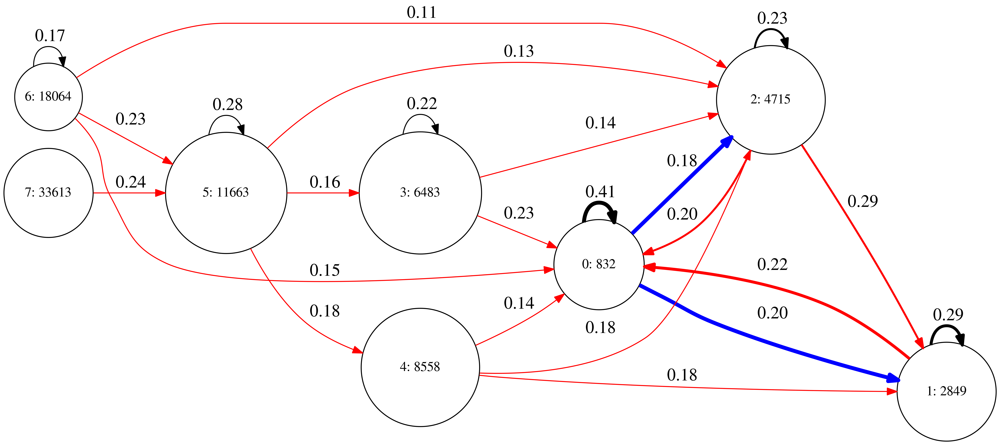

In [175]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Greens')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

### 雨→雨

In [176]:
# 雨->雨の場合に切り出し
hoge = np.vstack( [ nov_data[:, 7:9] ] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.3133  0.1687  0.1928  0.1325  0.1205  0.0482  0.0241  0.    ]
 [ 0.22    0.18    0.2     0.2     0.12    0.08    0.      0.    ]
 [ 0.15    0.1     0.15    0.275   0.15    0.15    0.025   0.    ]
 [ 0.1622  0.1622  0.1622  0.1622  0.1892  0.1622  0.      0.    ]
 [ 0.1053  0.1842  0.2105  0.0526  0.1053  0.2105  0.1316  0.    ]
 [ 0.0938  0.2188  0.0625  0.125   0.2188  0.2188  0.0625  0.    ]
 [ 0.125   0.2188  0.0938  0.1562  0.125   0.125   0.0938  0.0625]
 [ 0.      0.1667  0.      0.      0.3333  0.      0.3333  0.1667]]


/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


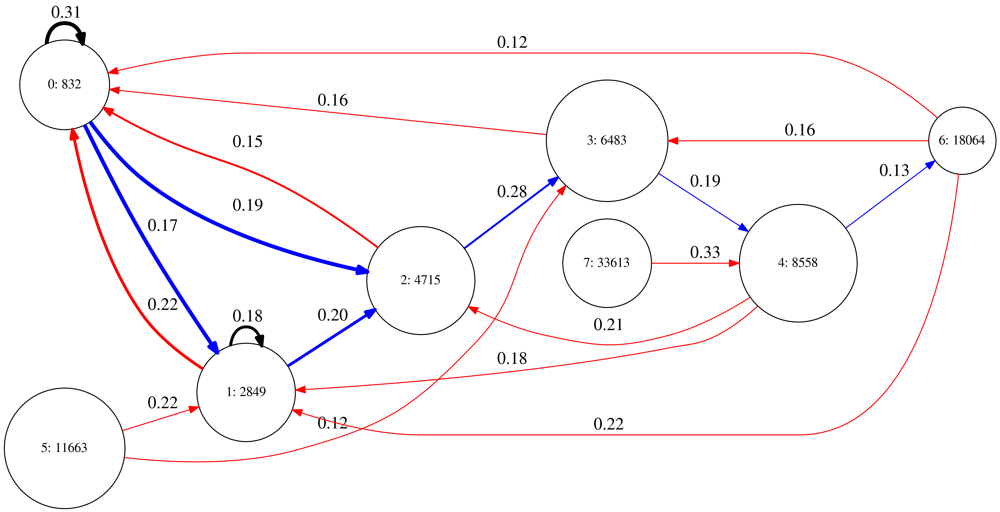

In [177]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Greens')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

# 曜日について解析

In [89]:
# 10日間の平日休日のリスト 平日が0、休日が1
DAY = np.array([[0, 1, 1, 0, 0, 0, 0, 0, 1, 1], 
                [0, 0, 0, 0, 1, 1, 1, 0, 0, 0], 
                [1, 0, 1, 0, 0, 0, 1, 1, 0, 0]])

### 休→休

In [178]:
N=8
# 休->休の場合に切り出し
hoge = np.vstack( [sep_data[:, 1:3],
                  sep_data[:, 8:],
                  oct_data[:, 4:6],
                  oct_data[:, 5:7],
                  oct_data[:, 6:8],
                  nov_data[:, 7:9]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.335   0.1576  0.1379  0.1084  0.133   0.0887  0.0296  0.0099]
 [ 0.1751  0.2203  0.1751  0.1695  0.1186  0.0847  0.0452  0.0113]
 [ 0.1307  0.1364  0.1875  0.2159  0.142   0.1307  0.0568  0.    ]
 [ 0.0794  0.1323  0.2328  0.1958  0.2011  0.1111  0.0317  0.0159]
 [ 0.1055  0.1256  0.1206  0.1608  0.196   0.1558  0.1256  0.0101]
 [ 0.0676  0.1126  0.1261  0.1171  0.1802  0.2523  0.1351  0.009 ]
 [ 0.0784  0.0784  0.0654  0.098   0.1307  0.2288  0.2614  0.0588]
 [ 0.0667  0.0333  0.      0.0667  0.1667  0.0333  0.3333  0.3   ]]


In [179]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Blues')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


### 休→平

In [180]:
# 休->平の場合に切り出し
hoge = np.vstack( [sep_data[:, 2:4],
                  oct_data[:, 7:9],
                  nov_data[:, 0:2],
                  nov_data[:, 2:4],
                  nov_data[:, 7:9]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.3249  0.2081  0.1675  0.1066  0.1371  0.0406  0.0102  0.0051]
 [ 0.1411  0.2393  0.2883  0.1472  0.092   0.0675  0.0245  0.    ]
 [ 0.087   0.1925  0.1863  0.2795  0.1242  0.1118  0.0186  0.    ]
 [ 0.09    0.125   0.21    0.28    0.135   0.11    0.05    0.    ]
 [ 0.0773  0.1256  0.1159  0.1932  0.2174  0.2029  0.0676  0.    ]
 [ 0.0685  0.1187  0.1279  0.1553  0.1918  0.2374  0.0913  0.0091]
 [ 0.0818  0.0818  0.1132  0.1006  0.1321  0.2767  0.1698  0.044 ]
 [ 0.0882  0.1176  0.0588  0.0294  0.1471  0.1765  0.2647  0.1176]]


/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


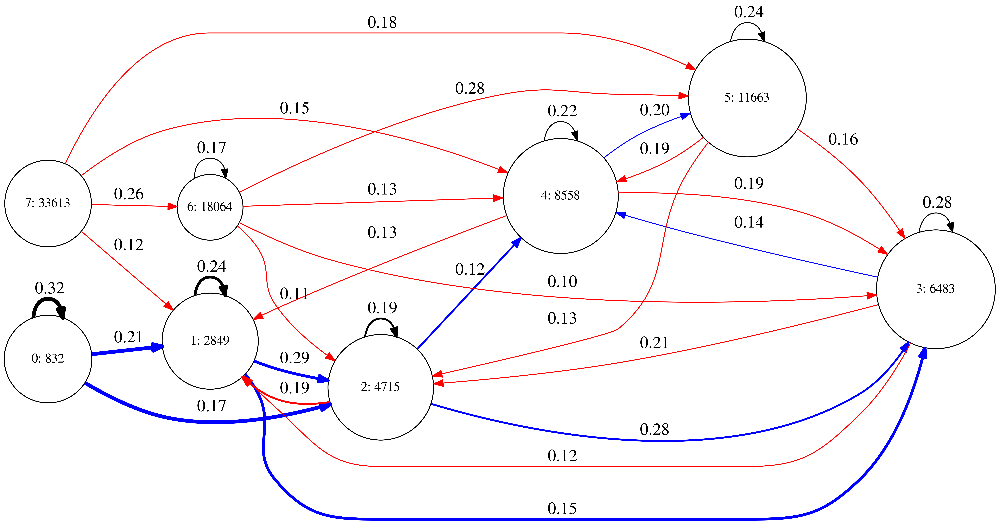

In [181]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Blues')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

### 平→休

In [182]:
# 平->休の場合に切り出し
hoge = np.vstack( [sep_data[:, 0:2],
                  sep_data[:, 7:9],
                  oct_data[:, 3:5],
                  nov_data[:, 1:3],
                  nov_data[:, 6:8]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.3664  0.145   0.145   0.084   0.1145  0.0611  0.0687  0.0153]
 [ 0.1125  0.1812  0.1312  0.1625  0.1     0.2     0.0875  0.025 ]
 [ 0.1117  0.1675  0.1168  0.1929  0.1574  0.1827  0.0609  0.0102]
 [ 0.1675  0.0985  0.0985  0.1872  0.1872  0.1527  0.1034  0.0049]
 [ 0.0989  0.1319  0.1648  0.1374  0.1593  0.1484  0.1374  0.022 ]
 [ 0.0303  0.0545  0.103   0.1455  0.1515  0.3212  0.1939  0.    ]
 [ 0.1348  0.0449  0.0112  0.0562  0.1685  0.2472  0.2584  0.0787]
 [ 0.      0.      0.0455  0.      0.0455  0.1818  0.4091  0.3182]]


/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


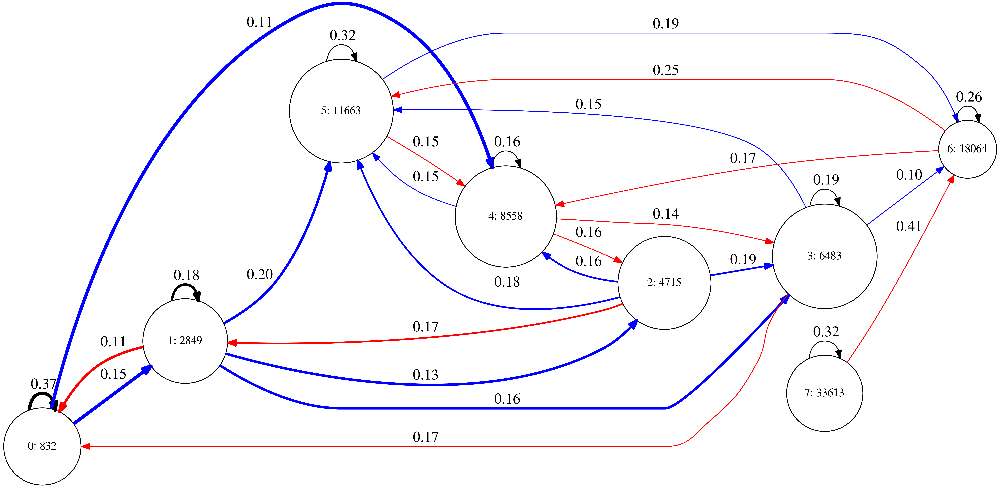

In [183]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Blues')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

### 平→平

In [184]:
# 平->平の場合に切り出し
hoge = np.vstack( [sep_data[:, 3:5],
                  sep_data[:, 4:6],
                  sep_data[:, 5:7],
                  sep_data[:, 6:8],
                  oct_data[:, 0:2],
                  oct_data[:, 1:3],
                  oct_data[:, 2:4],
                  oct_data[:, 7:9],
                  oct_data[:, 8:],
                  nov_data[:, 3:5],
                  nov_data[:, 4:6],
                  nov_data[:, 8:]] )

# s0->s0に遷移する確率みたいな感じを順番に数える
percent = np.array([[0.0 for i in range(N)] for j in range(N)])
for i in range(N):
    for j in range(N):
        percent[i, j] = float(np.count_nonzero( (hoge[:, 0] == i) & (hoge[:, 1] == j) )) / float(np.count_nonzero( (hoge[:, 0] == i)))
print np.around(percent, 4)

[[ 0.4098  0.2033  0.1148  0.1148  0.0852  0.0525  0.0197  0.    ]
 [ 0.1749  0.2924  0.2037  0.1462  0.107   0.0601  0.0157  0.    ]
 [ 0.0801  0.1808  0.2654  0.2197  0.1373  0.0847  0.0275  0.0046]
 [ 0.0578  0.1071  0.2184  0.2719  0.1884  0.1221  0.0321  0.0021]
 [ 0.048   0.0981  0.1211  0.2109  0.2547  0.2109  0.0564  0.    ]
 [ 0.044   0.0615  0.0813  0.1275  0.1868  0.3692  0.1143  0.0154]
 [ 0.0258  0.0361  0.0464  0.0773  0.1237  0.2938  0.3093  0.0876]
 [ 0.      0.0541  0.027   0.027   0.027   0.1081  0.2973  0.4595]]


/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


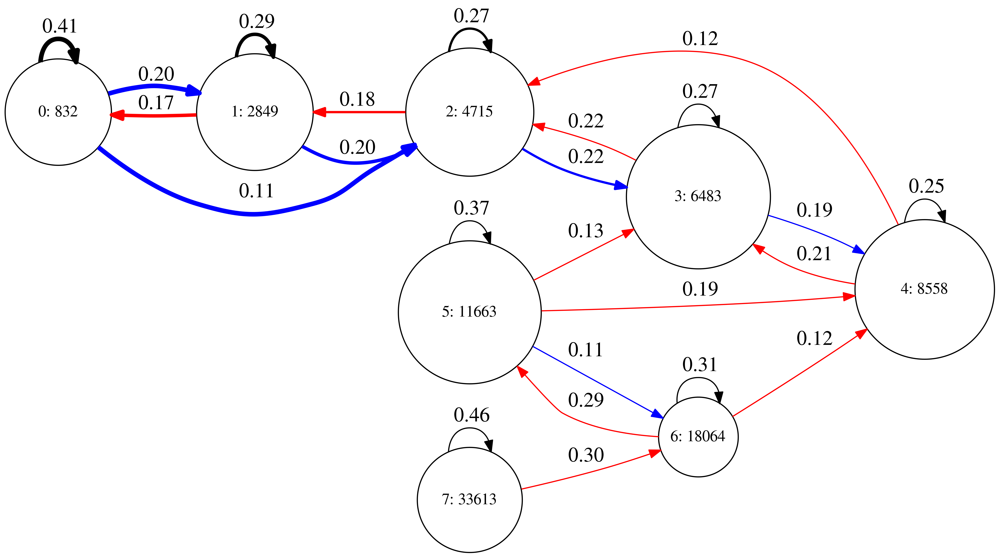

In [185]:
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
# seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Blues')
# plt.show()

# nxpdParams['show'] = 'ipynb'
# draw(combochart(counts_df, codebook, None, nrank=2, thresh=.15))
P = percent
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
# draw(combochart(P, sorted_codebook, None, nrank=2, thresh=.15))
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))

# 例示用の図をつくる

In [ ]:
random.uniform(0.0, 1.0)

In [ ]:
# percent = np.array([ [0.35, 0.30, 0.20, 0.15], [0.27, 0.40, 0.25, 0.10], [0.15, 0.30, 0.35, 0.20], [0.22, 0.23, 0.25, 0.35] ])
percent = np.array([ [0.40, 0.35, 0.25], [0.29, 0.40, 0.30], [0.25, 0.35, 0.40] ])
counts_df = pandas.DataFrame(percent)
# plt.figure(figsize=(11, 8))
seaborn.heatmap(counts_df, annot=False, fmt='g', cmap='Blues')
plt.show()

In [ ]:
P = np.array([ [0.33, 0.33, 0.33], [0.33, 0.33, 0.33], [0.33, 0.33, 0.303] ])
sorted_codebook = codebook
nxpdParams['show'] = 'ipynb'
draw(combochart(P, sorted_codebook, None, nrank=2, thresh=0.15))

# 全体解析の図を書き直し

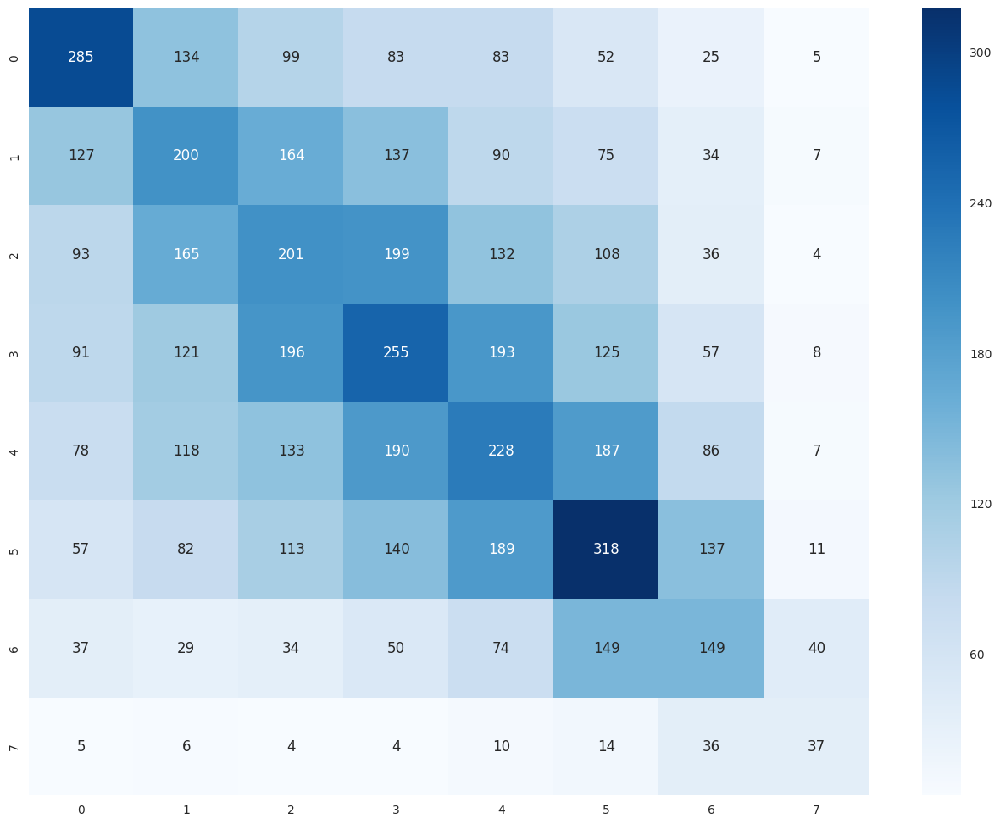

In [186]:
X = np.vstack([ sep_data, oct_data, nov_data ])
plt.figure(figsize=(16, 12))
N=8

P = numpy.zeros((N, N), numpy.float32)
counts = numpy.zeros((N, N), numpy.int32)

for x in X:
    for idx, s in enumerate(x):
        if idx == len(x) - 1: break
        counts[s][x[idx + 1]] += 1

counts_df = pandas.DataFrame(counts)
seaborn.heatmap(counts_df, annot=True, fmt='g', cmap='Blues')

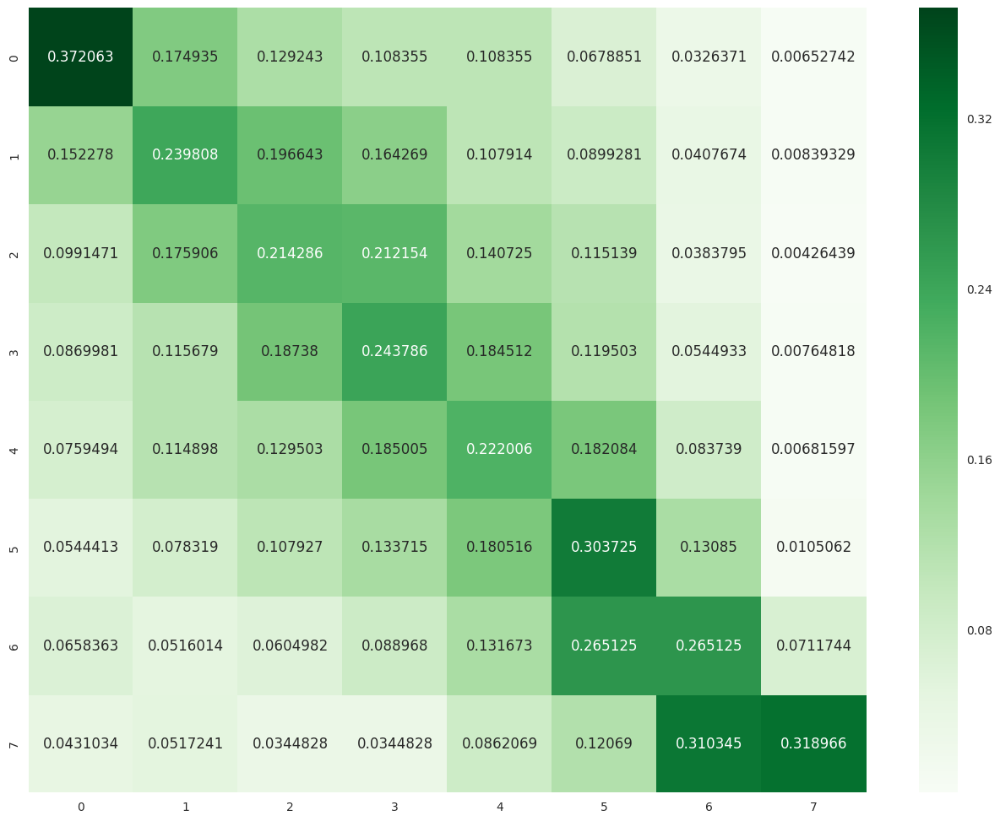

In [187]:
plt.figure(figsize=(16, 12))

for idx_i, cnt_row in enumerate(counts):
    for idx_j, cnt in enumerate(cnt_row):
        P[idx_i][idx_j] = float(cnt) / numpy.sum(counts[idx_i])

prob_df = pandas.DataFrame(P)
seaborn.heatmap(prob_df, annot=True, fmt='g', cmap='Greens')

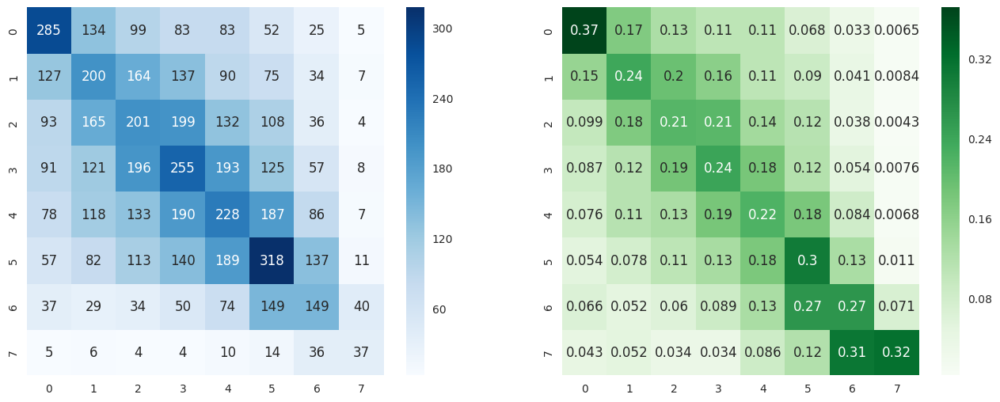

In [54]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6))
seaborn.heatmap(counts_df, annot=True, fmt='g', cmap='Blues', ax=ax1)
seaborn.heatmap(prob_df, annot=True, fmt='.2g', cmap='Greens', ax=ax2)

In [188]:
# from nxpd import draw, nxpdParams

nxpdParams['show'] = 'ipynb'
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='TB'))

/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


/var/lib/anaconda2/lib/python2.7/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)



quantity: 1.29812070094
quantity: 1.41845633949
quantity: 1.55834651932
quantity: 1.75539612745
quantity: 1.7012450901
quantity: 1.73433739071
quantity: 0.922071830445
quantity: 0.201562194584


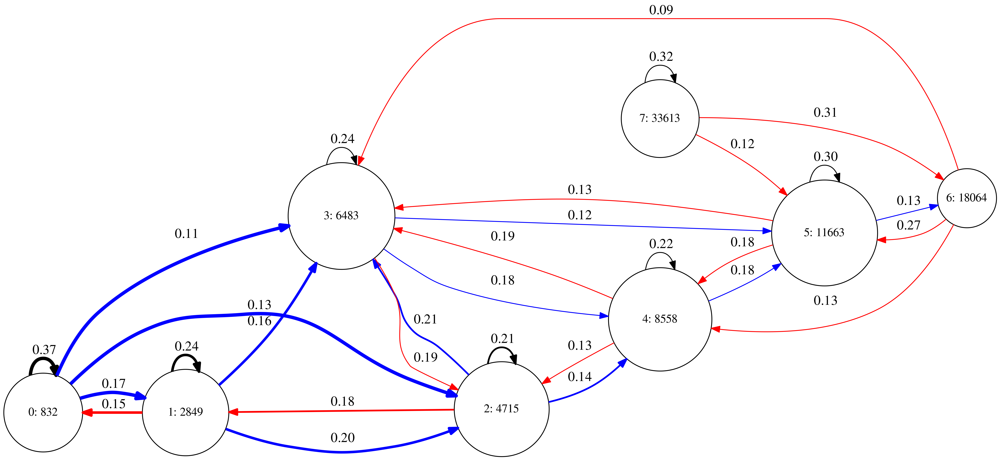

In [159]:
# from nxpd import draw, nxpdParams

nxpdParams['show'] = 'ipynb'
draw(combochart_p(P, X, sorted_codebook, pthresh=.8, direction='LR'))